In [1]:
## this package can open hyperspectral images
#!pip install spectral

# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# !pip install spectral
# !pip install pandas
# !pip install seaborn
# !pip list

In [12]:
import spectral
import spectral.io.envi as envi
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle

import numpy as np
import glob
import pandas as pd
import seaborn as sns

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

matplotlib.rcParams['figure.dpi'] = 300

In [13]:
# For google colab
# prefix = '/content/drive/'
# cloud = '/My Drive/'

# For desktop jupyter
# prefix = ''
# cloud = '/My Drive/'

# prefix = 'C:/Users/ADMIN/' # GETAC
prefix = 'C:/Users/David/' # office desktop
cloud = '/OneDrive - Rutgers University/'

project1 = prefix + cloud + '/HyperSpectral/DATA/2024-03-08-Sediment-Speed2-David/'
data1 = pd.read_csv(project1 + 'sediments-v2.csv')
print('data1:', data1.shape)
# data1.head(10)

project2 = prefix + cloud + '/HyperSpectral/DATA/2024-02-27-Sediment-Speed2-David/'
data2 = pd.read_csv(project2 + 'sediments-v2.csv')
print('data2:', data2.shape)


project3 = prefix + cloud + '/HyperSpectral/DATA/2024-04-23-Sediment-Speed2-David/'
data3 = pd.read_csv(project3 + '2024-04-23-sediments.csv')
print('data3:', data3.shape)

project4 = prefix + cloud + '/HyperSpectral/DATA/2024-04-24-Sediment-Speed2-David/'
data4 = pd.read_csv(project4 + '2024-04-24-sediments.csv')
print('data4:', data4.shape)

# dfz = data1.append((data2))
dfz = pd.concat((data1,data2,data3,data4))

print('dfz:  ', dfz.shape)

# dfz.head()
# dfz

a = dfz.loc[dfz['data_control'] == 'data'].iloc[:,-113:].copy().reset_index(drop=True)
b = dfz.loc[dfz['data_control'] == 'control_white'].iloc[:,-113:].copy().reset_index(drop=True)
a.div(b).head()

dfz_percent = dfz.loc[dfz['data_control'] == 'data'].copy().reset_index(drop=True)
# subset = dfz_percent.loc[dfz['data_control'] == 'data']
dfz_percent.iloc[:,-113:] = a.div(b) # 
dfz_percent['data_control'] = 'data_percent'

print('a:    ', a.shape)
print('b:    ', b.shape)
print('dfz_percent:', dfz_percent.shape)

dfz = pd.concat((dfz,dfz_percent)).reset_index(drop=True)
print('dfz:  ', dfz.shape)
dfz.head()



data1: (90, 130)
data2: (300, 130)
data3: (78, 130)
data4: (66, 130)
dfz:   (534, 130)
a:     (89, 113)
b:     (89, 113)
dfz_percent: (89, 130)
dfz:   (623, 130)


,sieve_size1,sieve_size2,sed_size1_um,sed_size2_um,sed_size_avg_um,particle_vol_cm³,particle_mass_g,log_particle_count,concentration_g/L,mass_g,volume_mL,date,speed,washed,lightSource,labWorker,data_control,398.1,403.5,408.8,414.2,419.6,425.0,430.4,435.8,441.2,446.6,452.0,457.4,462.8,468.2,473.6,479.0,484.4,489.8,495.2,500.6,506.0,511.4,516.8,522.2,527.6,533.0,538.4,543.8,549.2,554.6,560.0,565.4,570.8,576.2,581.6,587.0,592.4,597.8,603.2,608.6,614.0,619.4,624.8,630.2,635.6,641.0,646.4,651.8,657.2,662.6,667.9,673.3,678.7,684.1,689.5,694.9,700.3,705.7,711.1,716.5,721.9,727.3,732.7,738.1,743.5,748.9,754.3,759.7,765.1,770.5,775.9,781.3,786.7,792.1,797.5,802.9,808.3,813.7,819.1,824.5,829.9,835.3,840.7,846.1,851.5,856.9,862.3,867.7,873.1,878.5,883.9,889.3,894.7,900.1,905.5,910.9,916.3,921.7,927.1,932.4,937.8,943.2,948.6,954.0,959.4,964.8,970.2,975.6,981.0,986.4,991.8,997.2,1002.6
0,200,999,75,30,52.5,7.576656e-08,2.007814e-07,5.396247,0.1,0.05,500.0,2024-03-08 15:46:52,2,washed,incandescent-soft-40w,David B.,data,0.000038,0.000031,0.000024,0.000020,0.000019,0.000024,0.000039,0.000067,0.000108,0.000143,0.000141,0.000110,0.000082,0.000067,0.000059,0.000059,0.000066,0.000078,0.000091,0.000104,0.000114,0.000123,0.000130,0.000137,0.000143,0.000150,0.000158,0.000167,0.000178,0.000189,0.000199,0.000207,0.000216,0.000225,0.000234,0.000243,0.000249,0.000252,0.000251,0.000247,0.000241,0.000232,0.000221,0.000209,0.000196,0.000184,0.000172,0.000160,0.000147,0.000135,0.000123,0.000114,0.000105,0.000098,0.000092,0.000089,0.000087,0.000086,0.000085,0.000084,0.000083,0.000081,0.000079,0.000078,0.000078,0.000079,0.000079,0.000079,0.000079,0.000079,0.000080,0.000081,0.000083,0.000083,0.000085,0.000086,0.000086,0.000086,0.000085,0.000083,0.000082,0.000079,0.000078,0.000077,0.000077,0.000076,0.000077,0.000075,0.000075,0.000074,0.000073,0.000072,0.000071,0.000071,0.000071,0.000070,0.000068,0.000065,0.000062,0.000060,0.000054,0.000051,0.000049,0.000048,0.000048,0.000045,0.000046,0.000049,0.000049,0.000050,0.000050,0.000053,0.000050
1,200,999,75,30,52.5,7.576656e-08,2.007814e-07,5.396247,0.1,0.05,500.0,2024-03-08 15:47:37,2,washed,incandescent-soft-40w,David B.,data,0.000052,0.000041,0.000033,0.000026,0.000025,0.000026,0.000041,0.000068,0.000109,0.000145,0.000143,0.000111,0.000085,0.000069,0.000059,0.000060,0.000068,0.000079,0.000093,0.000105,0.000116,0.000124,0.000131,0.000138,0.000143,0.000151,0.000160,0.000169,0.000179,0.000190,0.000200,0.000209,0.000218,0.000227,0.000236,0.000244,0.000251,0.000254,0.000253,0.000249,0.000242,0.000234,0.000222,0.000210,0.000198,0.000185,0.000173,0.000162,0.000149,0.000136,0.000124,0.000115,0.000106,0.000100,0.000094,0.000090,0.000088,0.000087,0.000086,0.000086,0.000084,0.000082,0.000080,0.000078,0.000079,0.000079,0.000079,0.000079,0.000079,0.000080,0.000081,0.000082,0.000083,0.000084,0.000085,0.000086,0.000087,0.000087,0.000087,0.000085,0.000082,0.000080,0.000079,0.000079,0.000078,0.000078,0.000077,0.000077,0.000076,0.000075,0.000074,0.000073,0.000073,0.000073,0.000074,0.000073,0.000071,0.000069,0.000067,0.000063,0.000058,0.000055,0.000053,0.000052,0.000052,0.000053,0.000051,0.000056,0.000055,0.000055,0.000060,0.000062,0.000062
2,200,999,75,30,52.5,7.576656e-08,2.007814e-07,5.697277,0.2,0.10,500.0,2024-03-08 15:48:51,2,washed,incandescent-soft-40w,David B.,data,0.000050,0.000036,0.000027,0.000024,0.000021,0.000025,0.000039,0.000065,0.000108,0.000145,0.000145,0.000114,0.000087,0.000072,0.000063,0.000065,0.000074,0.000086,0.000103,0.000118,0.000133,0.000145,0.000156,0.000167,0.000177,0.000189,0.000202,0.000216,0.000232,0.000250,0.000267,0.000281,0.000296,0.000311,0.000327,0.000341,0.000352,0.000357,0.000357,0.000354,0.000346,0.000333,0.000317,0.000300,0.000283,0.000266,0.000249,0.000232,0.000214,0.000197,0.000182,0.000170,0.000160,0.000152,0.000143,0.000137,0.000133,0.000131,0.000128,0.000127,0.000124,0.000121,0.000118,0.000115,0.000114,0.000115,0.000115,0.000116,0.000116,0.000117,0.000119,0.000120,0.000123,0.000124,0.0001

In [2]:
# dfz_to_save = dfz.loc[dfz['data_control'] == 'data'].copy().reset_index(drop=True)
# filename = prefix + cloud + '/HyperSpectral/DATA/2024-0227-0424-sediment.csv'
# dfz_to_save.to_csv(filename, index=False)

In [3]:
# dfz.describe()

In [4]:
# dfz.dtypes

In [14]:
# this information is in the HDR file of each image
# bands = [398.05223904,  403.45018052,  408.848122  ,  414.24606348,
#          419.64400496,  425.04194644,  430.43988792,  435.8378294 ,
#         etc., etc.
#          981.02991891,  986.42786039,  991.82580187,  997.22374335,
#         1002.62168483]

bands = np.around(np.linspace(398.0522,1002.6217,113),decimals=1)
bands

array([ 398.1,  403.5,  408.8,  414.2,  419.6,  425. ,  430.4,  435.8,
        441.2,  446.6,  452. ,  457.4,  462.8,  468.2,  473.6,  479. ,
        484.4,  489.8,  495.2,  500.6,  506. ,  511.4,  516.8,  522.2,
        527.6,  533. ,  538.4,  543.8,  549.2,  554.6,  560. ,  565.4,
        570.8,  576.2,  581.6,  587. ,  592.4,  597.8,  603.2,  608.6,
        614. ,  619.4,  624.8,  630.2,  635.6,  641. ,  646.4,  651.8,
        657.2,  662.6,  667.9,  673.3,  678.7,  684.1,  689.5,  694.9,
        700.3,  705.7,  711.1,  716.5,  721.9,  727.3,  732.7,  738.1,
        743.5,  748.9,  754.3,  759.7,  765.1,  770.5,  775.9,  781.3,
        786.7,  792.1,  797.5,  802.9,  808.3,  813.7,  819.1,  824.5,
        829.9,  835.3,  840.7,  846.1,  851.5,  856.9,  862.3,  867.7,
        873.1,  878.5,  883.9,  889.3,  894.7,  900.1,  905.5,  910.9,
        916.3,  921.7,  927.1,  932.4,  937.8,  943.2,  948.6,  954. ,
        959.4,  964.8,  970.2,  975.6,  981. ,  986.4,  991.8,  997.2,
      

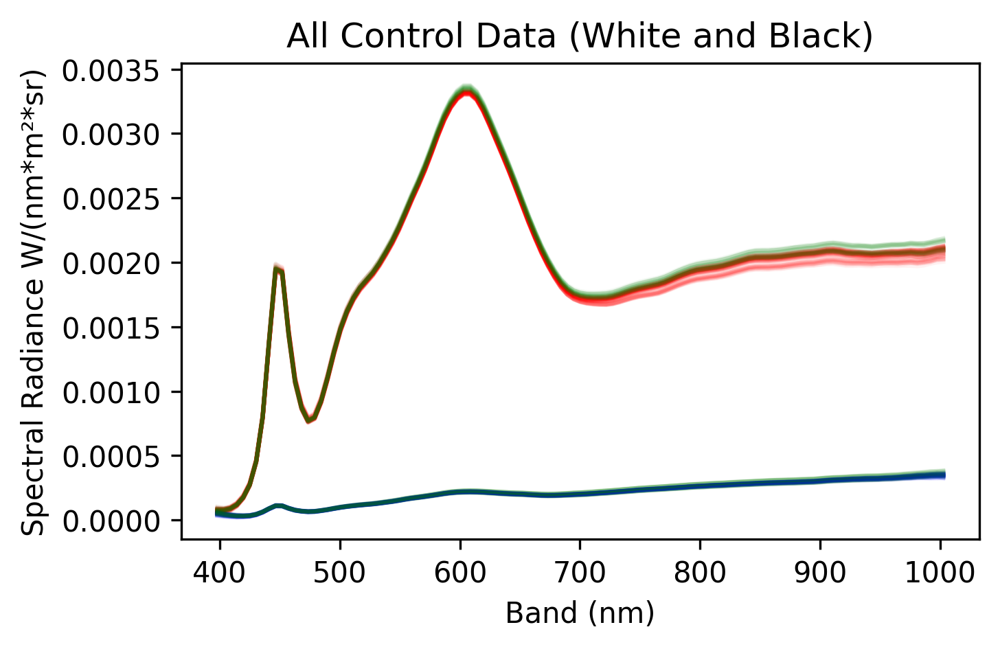

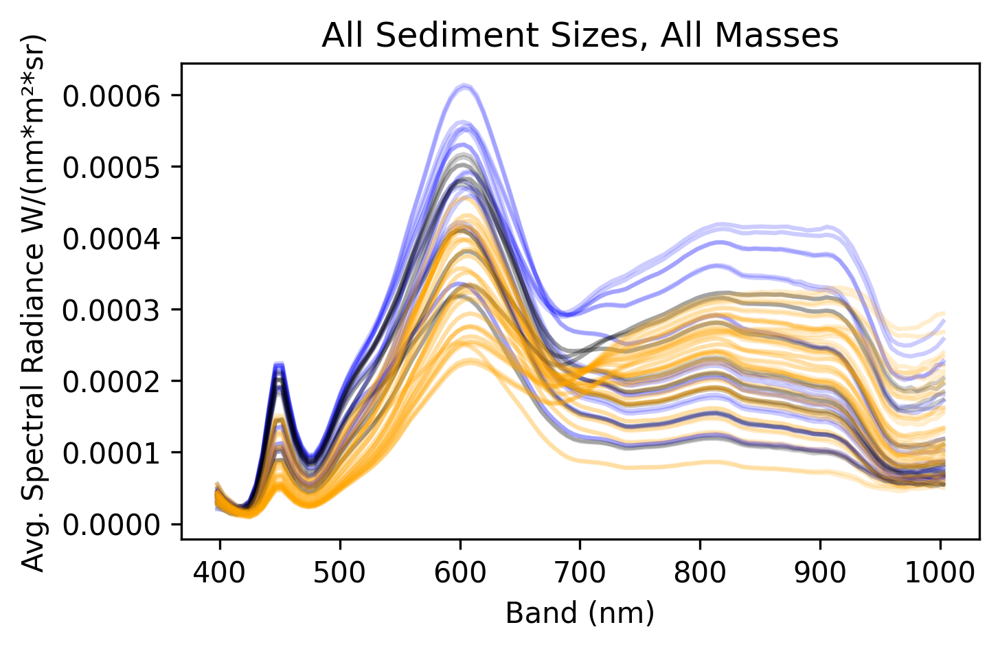

In [15]:
subset = dfz.loc[ (dfz['data_control'] == 'control_white') | (dfz['data_control'] == 'control_black') ]
subset.shape[0]
subset.columns[-113:]

# change plot size
plt.figure(figsize=(5,3))

for index, data in subset.iterrows(): # for i in range(0,subset.shape[0]):
  # print(data[-113:])
    # print(data['data_control'])

    if data['data_control'] == 'control_white':
        this_color = 'r'
    if data['data_control'] == 'control_black':
        this_color = 'b'
    if data['date'] > '2024-04-01':
        this_color = 'g'

    this_label = str(data['sieve_size1'])+"_"+str(data['sieve_size2'])+"_"+str(data['mass_g'])+"g"
    # this_color = 'r'

    plt.plot(bands,data[-113:], label=this_label, alpha=0.05, c=this_color) ##,c='r',alpha=0.5

plt.xlabel('Band (nm)')
plt.ylabel('Spectral Radiance W/(nm*m²*sr)')
plt.title('All Control Data (White and Black)')
#sey y limit
# plt.ylim(0,0.004)
# plt.legend()
subset = dfz.loc[ (dfz['data_control'] == 'data') & (dfz['sieve_size1'] != 0) ]
subset.shape[0]
subset.columns[-113:]
plt.show()



plt.figure(figsize=(5,3))

for index, data in subset.iterrows(): # for i in range(0,subset.shape[0]):

    this_label = str(data['sieve_size1'])+"_"+str(data['sieve_size1'])+"_"+str(data['mass_g'])+"g"
    if data['sieve_size1'] == 0:
      continue
    if data['sieve_size1'] == 20:
      this_color = 'r'
    if data['sieve_size1'] == 40:
      this_color = 'g'
    if data['sieve_size1'] == 60:
      this_color = 'b'
    if data['sieve_size1'] == 100:
      this_color = 'k'
    if data['sieve_size1'] == 200:
      this_color = 'orange'

    plt.plot(bands,data[-113:], label=this_label, alpha=0.2, c=this_color ) ##,c='r',alpha=0.5

plt.xlabel('Band (nm)')
plt.ylabel('Avg. Spectral Radiance W/(nm*m²*sr)')
plt.title('All Sediment Sizes, All Masses')
# plt.ylim(0,0.004)
# plt.legend()
plt.show()

0.0
37.5
52.5
112.5
200.0


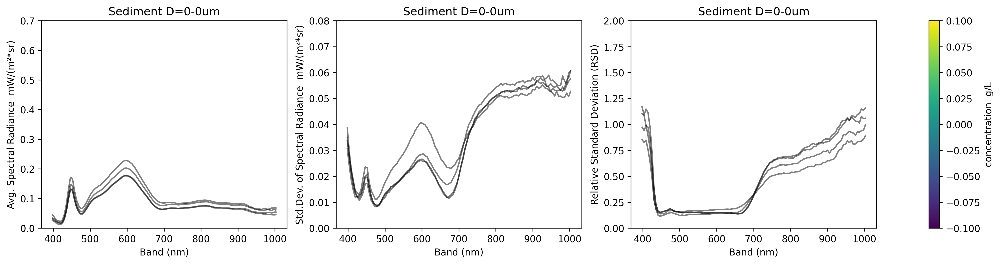

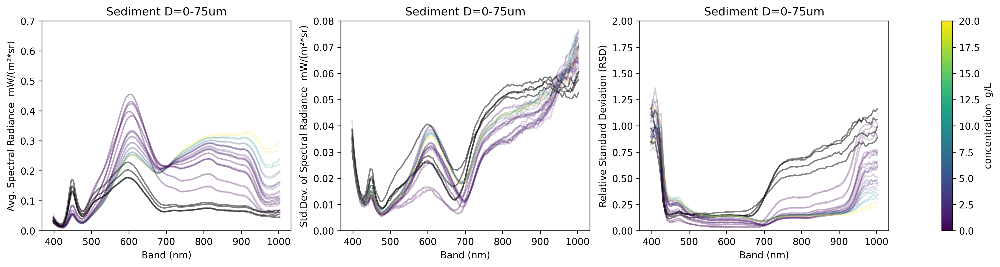

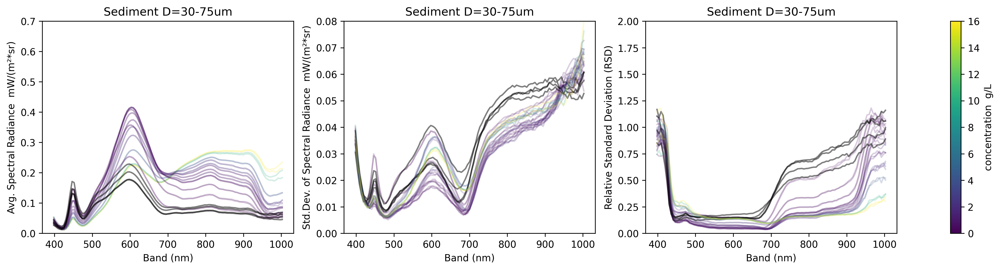

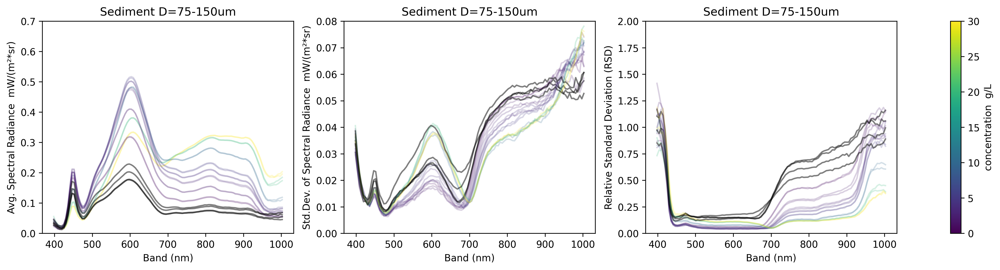

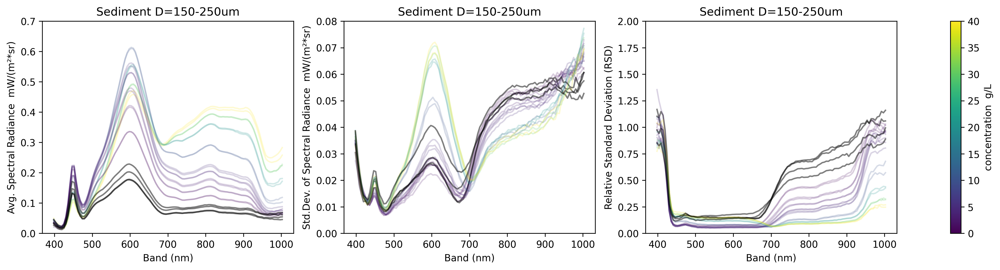

In [16]:
parameter = 'sed_size_avg_um' # sieve_size1


for size in sorted(dfz[parameter].unique().tolist()): # sed_size_avg_um
  print(size)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,4))
  # fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7,15))

  subsetData = dfz.loc[ ( (dfz[parameter] == 0) | (dfz[parameter] == size) ) & (dfz['data_control'] == 'data') ]
  subsetData.reset_index(inplace=True)
  
  # sort subsetData by concentration large to small
  subsetData = subsetData.sort_values(by='concentration_g/L', ascending=False)
  
  sizeRange1 = subsetData['sed_size1_um'].unique().tolist()[0]
  sizeRange2 = subsetData['sed_size2_um'].unique().tolist()[0]

  subsetStd = dfz.loc[ ( (dfz[parameter] == 0) | (dfz[parameter] == size)  ) & (dfz['data_control'] == 'data_std') ]
  subsetStd.reset_index(inplace=True)

  subsetRatio = subsetStd.copy()
  subsetRatio.iloc[:,-113:] = subsetStd.iloc[:,-113:] / subsetData.iloc[:,-113:]

  norm = mcolors.Normalize(vmin=min(subsetData["concentration_g/L"]), vmax=max(subsetData["concentration_g/L"]))

  for index, data1 in subsetData.iterrows(): 
    this_label1 = str(data1['concentration_g/L'])+"g"
    if data1['concentration_g/L'] == 0:
      color="black"
      alpha = 0.5
    else:
      color = plt.cm.viridis( norm(data1['concentration_g/L']) )
      alpha = 0.2
    ax1.plot(bands,data1[-113:]*1000, label=this_label1, alpha=alpha, c=color), 

  for index2, data2 in subsetStd.iterrows(): 
    this_label2 = str(data2['sieve_size1'])+"_"+str(data2['sieve_size2'])+"_"+str(data2['mass_g'])+"g"
    if data2['concentration_g/L'] == 0:
      color="black"
      alpha = 0.5
    else:
      color = plt.cm.viridis( norm(data2['concentration_g/L']) )
      alpha = 0.2
    ax2.plot(bands,data2[-113:]*1000, label=this_label2, alpha=alpha, c=color)

  for index3, data3 in subsetRatio.iterrows():
    this_label3 = str(data3['sieve_size1'])+"_"+str(data3['sieve_size2'])+"_"+str(data3['concentration_g/L'])+"g"
    if data3['concentration_g/L'] == 0:
      color="black"
      alpha = 0.5
    else:
      color = plt.cm.viridis( norm(data3['concentration_g/L']) )
      alpha = 0.2
    ax3.plot(bands,data3[-113:], label=this_label3, alpha=alpha, c=color)


  # this_title1 = 'Size ' + str(data1['sed_size2_um']) + "-" + str(data1['sed_size1_um']) + 'um Sediment'
  # this_title1 = 'Size ' + str(size) + 'um Sediment'
  this_title1 = 'Sediment D=' + str(sizeRange2) + "-" + str(sizeRange1) + 'um'
  ax1.set(xlabel='Band (nm)',ylabel='Avg. Spectral Radiance  mW/(m²*sr)',title=this_title1)
  ax1.set(ylim={0,0.0007*1000})
  # ax1.ticklabel_format(axis='y', style='sci', scilimits=(-4,-4))

  # this_title2 = 'Size ' + str(data2['sed_size2_um']) + "-" + str(data2['sed_size1_um']) + 'um Sediment'
  ax2.set(xlabel='Band (nm)',ylabel='Std.Dev. of Spectral Radiance  mW/(m²*sr)',title=this_title1)
  ax2.set(ylim={0,8.0e-5*1000})

  # this_title3 = 'Size ' + str(data3['sed_size2_um']) + "-" + str(data3['sed_size1_um']) + 'um Sediment'
  ax3.set(xlabel='Band (nm)',ylabel='Relative Standard Deviation (RSD)',title=this_title1)
  ax3.set(ylim={0,2.0})


  # plt.title(this_title)
  # ax1.xlabel('Band')
  # ax1.ylabel('Intensity')
  # ax1.legend()
  # ax2.legend()
# plt.colorbar(ax1,cax=ax1)


  sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
  sm.set_array([])
  cbar = fig.colorbar(sm, ax=[ax1, ax2, ax3], orientation='vertical')
  # cbar = fig.colorbar(sm, ax=[ax1, ax2, ax3], orientation='horizontal')
  cbar.set_label('concentration  g/L')

# plt.tight_layout()  # Adjust layout to prevent overlap

# plt.show()

0.0
37.5
52.5
112.5


C:\Users\David\AppData\Local\Temp\ipykernel_17936\172513889.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels([f'{x:.0f}%' for x in ax1.get_yticks()])
C:\Users\David\AppData\Local\Temp\ipykernel_17936\172513889.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels([f'{x:.0f}%' for x in ax1.get_yticks()])
C:\Users\David\AppData\Local\Temp\ipykernel_17936\172513889.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels([f'{x:.0f}%' for x in ax1.get_yticks()])
C:\Users\David\AppData\Local\Temp\ipykernel_17936\172513889.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels([f'{x:.0f

200.0


C:\Users\David\AppData\Local\Temp\ipykernel_17936\172513889.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_yticklabels([f'{x:.0f}%' for x in ax1.get_yticks()])


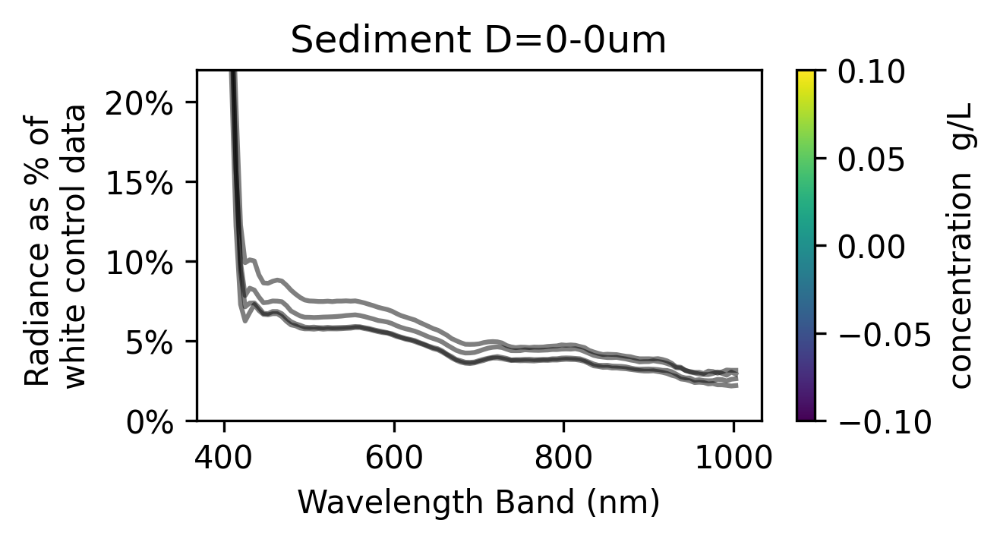

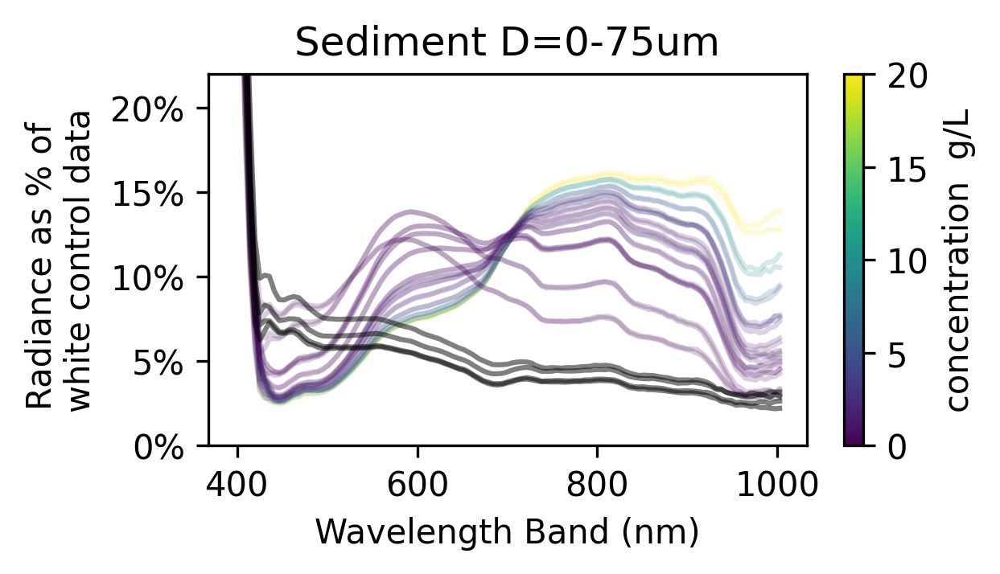

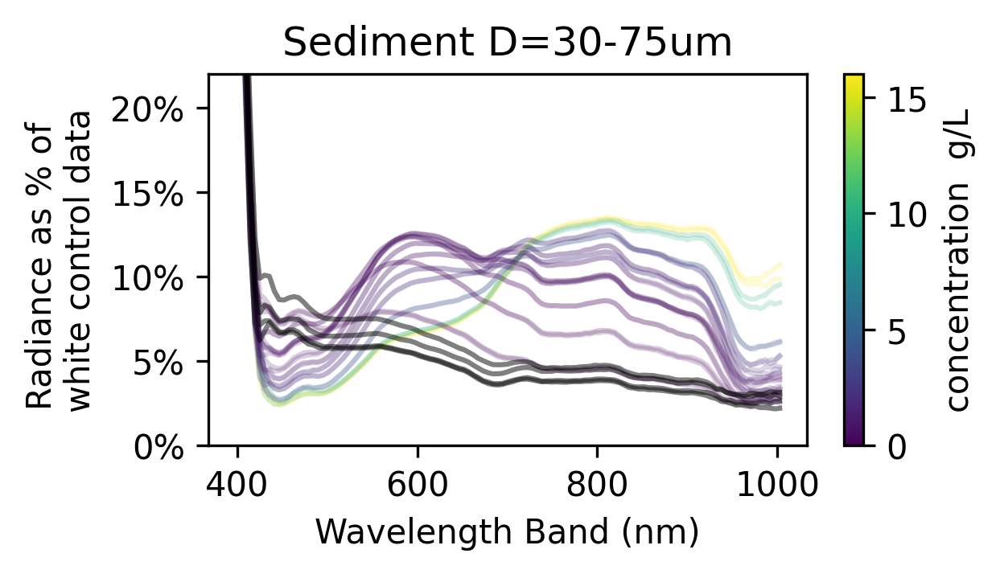

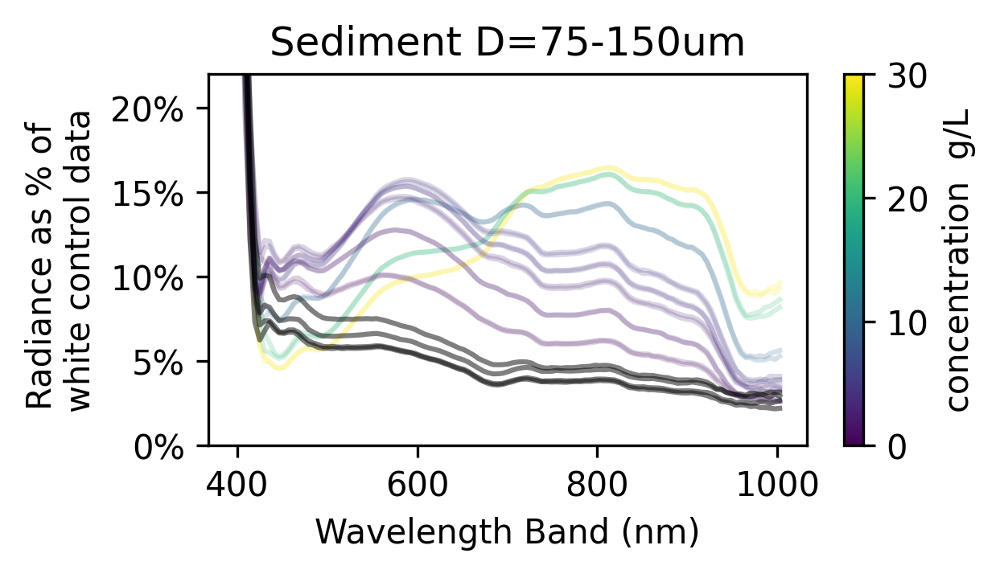

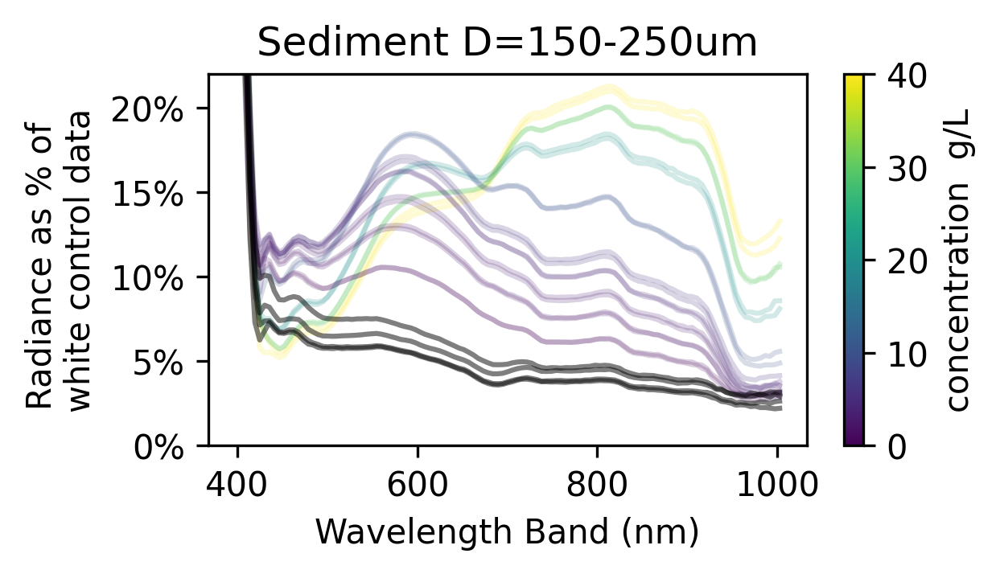

In [17]:
parameter = 'sed_size_avg_um' # sieve_size1


for size in sorted(dfz[parameter].unique().tolist()): # sed_size_avg_um
  print(size)

  fig, (ax1) = plt.subplots(1, 1, figsize=(4,2))

  subsetData = dfz.loc[ ( (dfz[parameter] == 0) | (dfz[parameter] == size) ) & (dfz['data_control'] == 'data_percent') ]
  subsetData.reset_index(inplace=True)

  subsetData = subsetData.sort_values(by='concentration_g/L', ascending=False)

  sizeRange1 = subsetData['sed_size1_um'].unique().tolist()[0]
  sizeRange2 = subsetData['sed_size2_um'].unique().tolist()[0]

  subsetStd = dfz.loc[ ( (dfz[parameter] == 0) | (dfz[parameter] == size)  ) & (dfz['data_control'] == 'data_std') ]
  subsetStd.reset_index(inplace=True)

  subsetRatio = subsetStd.copy()
  subsetRatio.iloc[:,-113:] = subsetStd.iloc[:,-113:] / subsetData.iloc[:,-113:]

  norm = mcolors.Normalize(vmin=min(subsetData["concentration_g/L"]), vmax=max(subsetData["concentration_g/L"]))

  for index, data1 in subsetData.iterrows(): 
    this_label1 = str(data1['concentration_g/L'])+"g"
    if data1['concentration_g/L'] == 0:
      color="black"
      alpha = 0.5
    else:
      color = plt.cm.viridis( norm(data1['concentration_g/L']) )
      alpha = 0.2
    ax1.plot(bands,data1[-113:]*100, label=this_label1, alpha=alpha, c=color), 

  for index2, data2 in subsetStd.iterrows(): 
    this_label2 = str(data2['sieve_size1'])+"_"+str(data2['sieve_size2'])+"_"+str(data2['mass_g'])+"g"
    if data2['concentration_g/L'] == 0:
      color="black"
      alpha = 0.5
    else:
      color = plt.cm.viridis( norm(data2['concentration_g/L']) )
      alpha = 0.2
    # ax2.plot(bands,data2[-113:], label=this_label2, alpha=alpha, c=color)

  for index3, data3 in subsetRatio.iterrows():
    this_label3 = str(data3['sieve_size1'])+"_"+str(data3['sieve_size2'])+"_"+str(data3['concentration_g/L'])+"g"
    if data3['concentration_g/L'] == 0:
      color="black"
      alpha = 0.5
    else:
      color = plt.cm.viridis( norm(data3['concentration_g/L']) )
      alpha = 0.2
    # ax3.plot(bands,data3[-113:], label=this_label3, alpha=alpha, c=color)


  # this_title1 = 'Size ' + str(data1['sed_size2_um']) + "-" + str(data1['sed_size1_um']) + 'um Sediment'
  # this_title1 = 'Size ' + str(size) + 'um Sediment'
  this_title1 = 'Sediment D=' + str(sizeRange2) + "-" + str(sizeRange1) + 'um'
  ax1.set(xlabel='Wavelength Band (nm)',ylabel='Radiance as % of \nwhite control data',title=this_title1)
  ax1.set(ylim={0,22})
  ax1.set_yticklabels([f'{x:.0f}%' for x in ax1.get_yticks()])
   
  # this_title2 = 'Size ' + str(data2['sed_size2_um']) + "-" + str(data2['sed_size1_um']) + 'um Sediment'
#   ax2.set(xlabel='Band (nm)',ylabel='Std.Dev. of Spectral Radiance   W/(nm*m²*sr)',title=this_title1)
#   ax2.set(ylim={0,8.0e-5})

  # this_title3 = 'Size ' + str(data3['sed_size2_um']) + "-" + str(data3['sed_size1_um']) + 'um Sediment'
#   ax3.set(xlabel='Band (nm)',ylabel='Std.Dev. / Avg.',title=this_title1)
#   ax3.set(ylim={0,2.0})


  # plt.title(this_title)
  # ax1.xlabel('Band')
  # ax1.ylabel('Intensity')
  # ax1.legend()
  # ax2.legend()
# plt.colorbar(ax1,cax=ax1)
  
  sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
  sm.set_array([])
  cbar = fig.colorbar(sm, ax=[ax1], orientation='vertical')
  cbar.set_label('concentration  g/L')

# plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

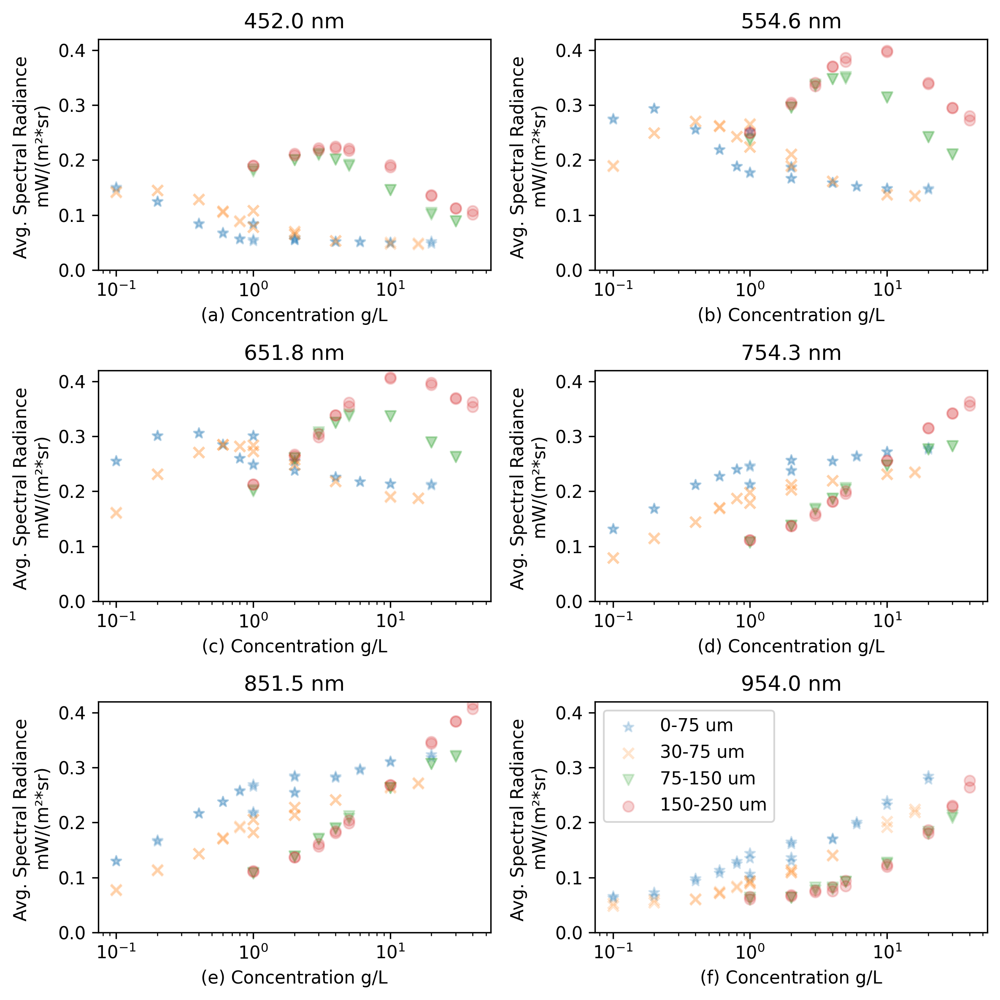

In [18]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(3, 2, figsize=(8,8))

bands1 = ['452.0','554.6','651.8','754.3','851.5','954.0']
symbols = ['*', 'x', 'v', 'o']
letters = ['a', 'b', 'c', 'd', 'e', 'f']
s = 0

for size in sorted(dfz['sed_size_avg_um'].unique()):

    subsetData = dfz.loc[(dfz['sed_size_avg_um'] == size) & (dfz['data_control'] == 'data')]
    
    if size == 0:
        continue
    
    thisLabel = str(subsetData['sed_size2_um'].values[0]) + '-' +str(subsetData['sed_size1_um'].values[0]) + ' um'

    i = 0
    # row = 1
    for ax in axes.flat:
        ax.scatter(subsetData['concentration_g/L'], subsetData[bands1[i]]*1000, label=thisLabel, marker=symbols[s], alpha=0.2) ##,c='r',alpha=0.5
        ax.set(xlabel=f'({letters[i]}) ' + 'Concentration g/L',
               ylabel='Avg. Spectral Radiance \nmW/(m²*sr)',
               title=str(np.around(float(bands1[i]),1)) + ' nm')
        ax.set_xscale('log')
        # ax.ticklabel_format(axis='y', style='sci', scilimits=(-4,-4))

        ax.set(ylim={0,4.2e-4*1000})
        i += 1
        if (i == -1) or (i == 6): # or (i == 6)
            ax.legend()

        # if i > 3:
        #     row = 1
    s += 1

#show one legend under the subplots

plt.tight_layout()
plt.show()


(89, 130)
(89, 132)


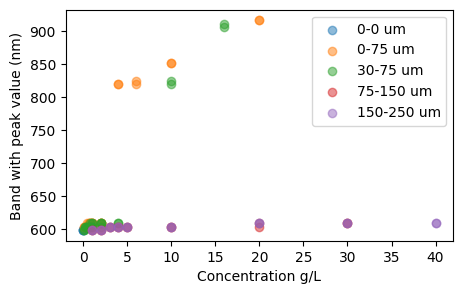

In [48]:
subset = dfz.loc[ (dfz['data_control'] == 'data')].copy().reset_index(drop=True)
print(subset.shape)
subset['max_value'] = ''
subset['max_band'] = ''

# rearrange the columns so that the last 113 columns are the spectral data
columns = subset.columns.tolist()
new_columns = columns[:17] + columns[-2:] + columns[-115:-2]
subset = subset[new_columns]
print(subset.shape)

for index, data in subset.iterrows():
    max_value = np.max(data[-113:])
    max_value_loc = np.argmax(data[-113:])
    max_band = bands[max_value_loc]
    subset.at[index,'max_value'] = max_value
    subset.at[index,'max_band'] = max_band

subset.head()

# plot max value vs concentration and color code each point by size
plt.figure(figsize=(5,3))

for size in sorted(subset['sed_size_avg_um'].unique()):
    subsetData = subset.loc[subset['sed_size_avg_um'] == size]
    thisLabel = str(subsetData['sed_size2_um'].values[0]) + '-' +str(subsetData['sed_size1_um'].values[0]) + ' um'
    plt.scatter(subsetData['concentration_g/L'], subsetData['max_band'], label=thisLabel, alpha=0.5) ##,c='r',alpha=0.5
    # label x and y axis
    plt.xlabel('Concentration g/L')
    plt.ylabel('Band with peak value (nm)')
    plt.legend()


In [19]:
# subset[398.1]

37.5 (26, 130)
52.5 (25, 130)
112.5 (16, 130)
200.0 (18, 130)


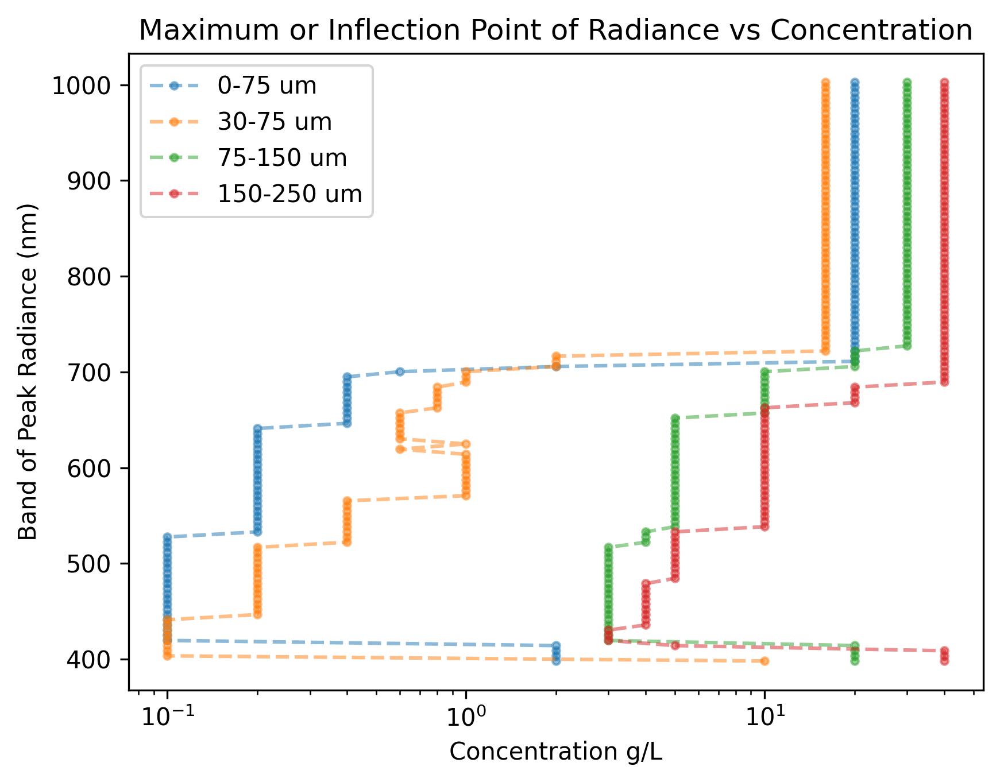

In [21]:
subset = dfz.loc[ (dfz['data_control'] == 'data') & (dfz['sed_size_avg_um'] > 0) ].copy().reset_index(drop=True)
my_list = []
my_sizes = []
mylabels=[]
# for each size, return the concentration with the max value for each wavelength
for size in sorted(subset['sed_size_avg_um'].unique()):
    my_sizes.append(size)
    subsetData = subset.loc[subset['sed_size_avg_um'] == size].reset_index(drop=True)
    thisLabel = str(subsetData['sed_size2_um'].values[0]) + '-' +str(subsetData['sed_size1_um'].values[0]) + ' um'
    mylabels.append(thisLabel)
    print(size, subsetData.shape)
    my_sublist = []
    for band in bands:
        # print(subsetData[str(band)])
        max_value = np.max(subsetData[str(band)])
        max_value_loc = np.argmax(subsetData[str(band)])
        max_concentration = subsetData.loc[max_value_loc,'concentration_g/L']
        # print(size, band, max_value, max_value_loc, max_concentration)
        my_sublist.append(max_concentration)
        # subset.loc[(subset['sed_size_avg_um'] == size) & (subset[band] == max_value), 'max_concentration'] = max_concentration
    my_list.append(my_sublist)
    # for the last 

my_list[0]

i=0
for concentration in my_list:
    
    #plot the values of the list against bands
    plt.plot(concentration,bands,marker='.',alpha=0.5,linestyle='--',label=mylabels[i])
    # make the line dashed
    i += 1

plt.xlabel('Concentration g/L')
# x axis is logaritmic
plt.xscale('log')
plt.ylabel('Band of Peak Radiance (nm)')
plt.title('Maximum or Inflection Point of Radiance vs Concentration')
plt.legend()

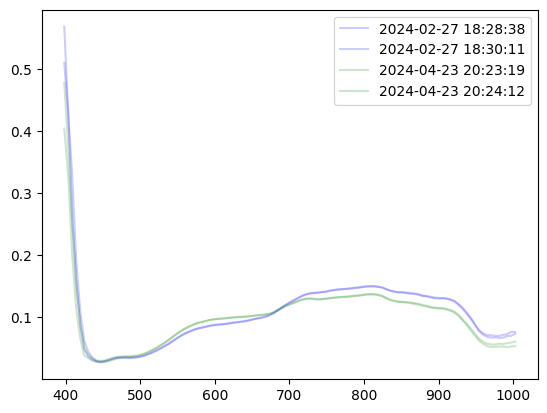

In [16]:
# plot bands vs concentration for the size 37.5 sediment particles
subset = dfz.loc[(dfz['sed_size_avg_um'] == 37.5) & (dfz['mass_g'] == 1.0)  & (dfz['data_control'] == 'data_percent')]

# for each item in the subset, plot the bands vs concentration
for index, data in subset.iterrows():
    if data['date'] > '2024-04-01':
        this_color = 'g'
    else:
        this_color = 'b'
    plt.plot(bands,data[-113:], alpha=0.2, c=this_color, label=data['date']) ##,c='r',alpha=0.5
    plt.legend()


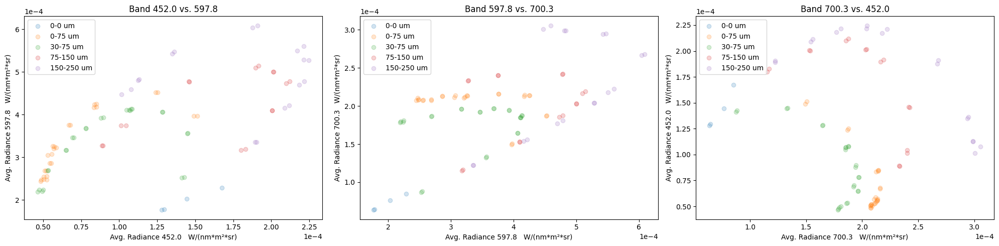

In [17]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(20,5))

bands1 = ['452.0', '597.8', '700.3',]  # Bands to plot
bands2 = bands1[1:]
bands2.append(bands1[:1][0])


for size in sorted(dfz['sed_size_avg_um'].unique()):
    subsetData = dfz.loc[(dfz['sed_size_avg_um'] == size) & (dfz['data_control'] == 'data')]
    thisLabel = str(subsetData['sed_size2_um'].values[0]) + '-' +str(subsetData['sed_size1_um'].values[0]) + ' um'

    i = 0
    for ax in axes:
        ax.scatter(subsetData[bands1[i]], subsetData[bands2[i]], label=thisLabel, alpha=0.2) ##,c='r',alpha=0.5
        ax.set(xlabel='Avg. Radiance ' + bands1[i] + '   W/(nm*m²*sr)',
               ylabel='Avg. Radiance ' + bands2[i]  + '   W/(nm*m²*sr)',
               title='Band ' + bands1[i] + ' vs. ' + bands2[i])
        ax.legend()
        # plot x axis in scientific notation
        ax.ticklabel_format(axis='both', style='sci', scilimits=(-4,-4))
        i += 1

plt.tight_layout()
plt.show()


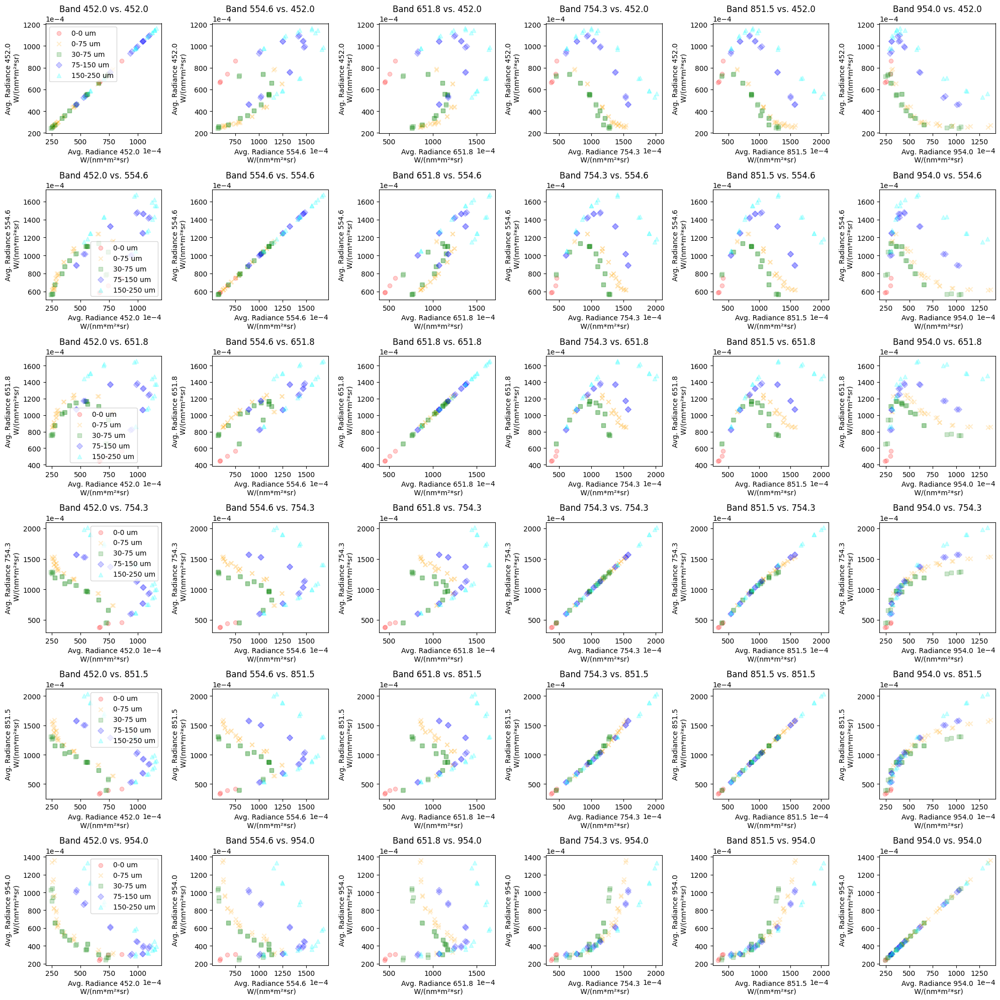

In [18]:
import matplotlib.pyplot as plt


bands1 = ['452.0','554.6','651.8','754.3','851.5', '954.0']
bands2 = bands1 # Bands to plot
# bands2 = bands1[1:]
# bands2.append(bands1[:1][0])

fig, axes = plt.subplots(len(bands1), len(bands1), figsize=(20,20))

colors = ['r', 'orange', 'green', 'blue', 'cyan', 'purple', 'black']
symbols = ['o', 'x', 's', 'D', '^', 'v', 'p']

k = 0
for size in sorted(dfz['sed_size_avg_um'].unique()):
    subsetData = dfz.loc[(dfz['sed_size_avg_um'] == size) & (dfz['data_control'] == 'data_percent')]
    thisLabel = str(subsetData['sed_size2_um'].values[0]) + '-' +str(subsetData['sed_size1_um'].values[0]) + ' um'

    i = 0
    j = 0


    for ax in axes.flatten():
        
        b1i = i%len(bands1)
        b2i = int(np.floor(j/len(bands1)))
        
        # print(i,j, b1i, b2i, bands1[b1i], bands2[b2i])
        
        # set the alpha values to scale with the concentration
        # alpha = subsetData['concentration_g/L'] / max(subsetData['concentration_g/L'])


        ax.scatter(subsetData[bands1[b1i]], subsetData[bands2[b2i]], label=thisLabel, alpha=0.2, color=colors[k], marker=symbols[k]) ##,c='r',alpha=0.5
        ax.set(xlabel='Avg. Radiance ' + bands1[b1i] + '\n W/(nm*m²*sr)',
               ylabel='Avg. Radiance ' + bands2[b2i]  + '\n W/(nm*m²*sr)',
               title='Band ' + bands1[b1i] + ' vs. ' + bands2[b2i])
        # plot x axis in scientific notation
        ax.ticklabel_format(axis='both', style='sci', scilimits=(-4,-4))

        if b1i==0:
            ax.legend()

        i += 1
        j += 1
    
    k +=1
    
plt.tight_layout()
plt.show()

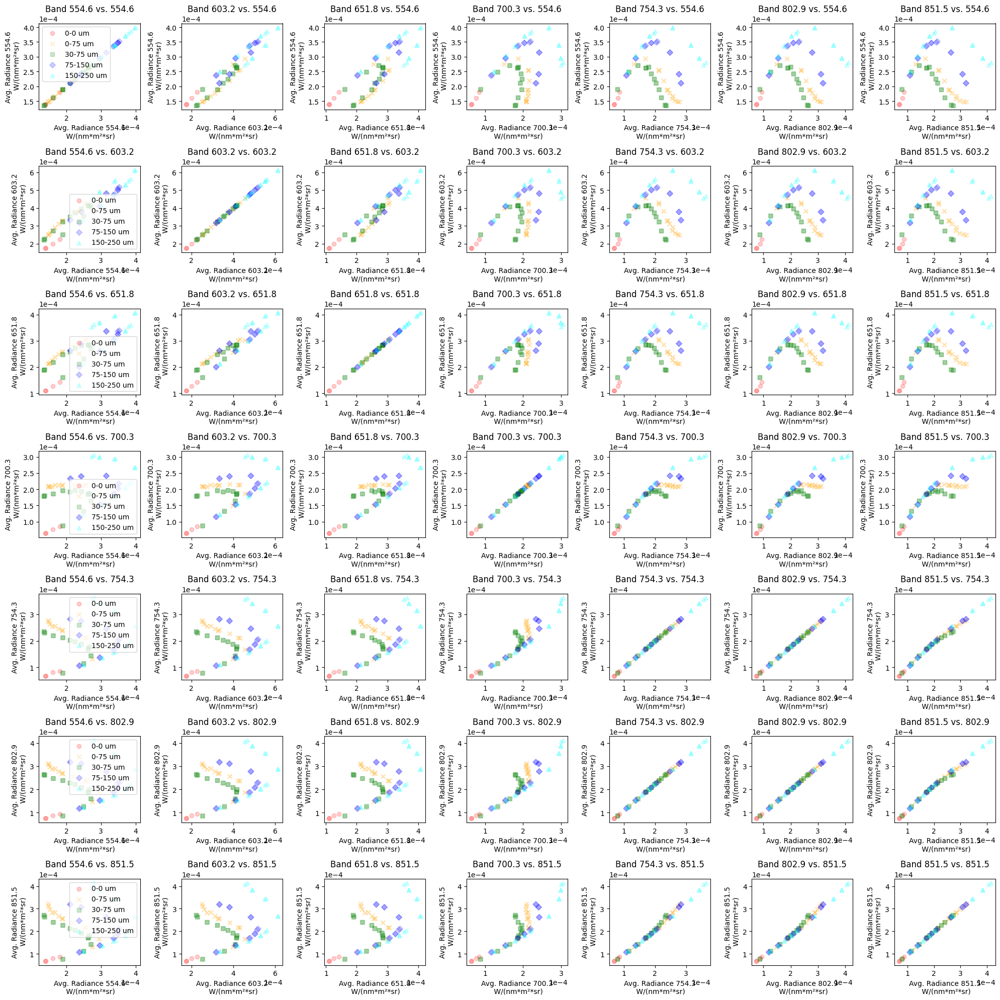

In [19]:
import matplotlib.pyplot as plt


bands1 = ['554.6','603.2','651.8','700.3','754.3','802.9','851.5']
bands2 = bands1 # Bands to plot
# bands2 = bands1[1:]
# bands2.append(bands1[:1][0])

fig, axes = plt.subplots(len(bands1), len(bands1), figsize=(20,20))

colors = ['r', 'orange', 'green', 'blue', 'cyan', 'purple', 'black']
symbols = ['o', 'x', 's', 'D', '^', 'v', 'p']

k = 0
for size in sorted(dfz['sed_size_avg_um'].unique()):
    subsetData = dfz.loc[(dfz['sed_size_avg_um'] == size) & (dfz['data_control'] == 'data')]
    thisLabel = str(subsetData['sed_size2_um'].values[0]) + '-' +str(subsetData['sed_size1_um'].values[0]) + ' um'

    i = 0
    j = 0
    for ax in axes.flatten():
        
        b1i = i%len(bands1)
        b2i = int(np.floor(j/len(bands1)))
        
        # print(i,j, b1i, b2i, bands1[b1i], bands2[b2i])

        ax.scatter(subsetData[bands1[b1i]], subsetData[bands2[b2i]], label=thisLabel, alpha=0.2, color=colors[k], marker=symbols[k]) ##,c='r',alpha=0.5
        ax.set(xlabel='Avg. Radiance ' + bands1[b1i] + '\n W/(nm*m²*sr)',
               ylabel='Avg. Radiance ' + bands2[b2i]  + '\n W/(nm*m²*sr)',
               title='Band ' + bands1[b1i] + ' vs. ' + bands2[b2i])
        # plot x axis in scientific notation
        ax.ticklabel_format(axis='both', style='sci', scilimits=(-4,-4))

        if b1i==0:
            ax.legend()

        i += 1
        j += 1
    
    k +=1
    
plt.tight_layout()
plt.show()
